In [1]:
import os
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torch.autograd import Variable

import torchvision
from torchvision import datasets
from torchvision.transforms import ToTensor, Compose, Resize, Normalize
from torchvision.io import read_image

import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [2]:
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


In [3]:
class ImageDataset(Dataset):
    def __init__(self,img_folder,transform):
        self.transform=transform
        self.img_folder=img_folder

        self.image_names=[i for i in os.listdir(self.img_folder) if '.jpg' in i]
   
    def __len__(self):
        return len(self.image_names)
 
    def __getitem__(self, index):
        image_path = self.img_folder + self.image_names[index]
        image=Image.open(image_path)
        image=self.transform(image)

        return image

In [4]:
img_dim = 64
training_data = ImageDataset(img_folder='sample_data/img/',transform=Compose([
                                               Resize((img_dim, img_dim)),
                                               ToTensor(),
                                               Normalize(0,1),
                                           ]))
batch_size = 32

train_dataloader = DataLoader(training_data, batch_size = batch_size)

In [5]:
for X in train_dataloader:
    print(X.shape)
    break

torch.Size([32, 3, 64, 64])


In [6]:
def weights_init(m):
    classname = m.__class__.__name__

    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
    elif classname.find('Linear') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        if m.bias is not None:
            m.bias.data.fill_(0)

In [7]:
class Generator(nn.Module):
    def __init__(self, z_dim, img_dim, num_channel = 3):
        super(Generator, self).__init__()
        self.output_bias = nn.Parameter(torch.zeros(3,img_dim, img_dim), requires_grad = True)
        self.main = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 256, 4, stride = 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(negative_slope = 0.1, inplace=True),
            
            nn.ConvTranspose2d(256, 128, 4, stride = 2, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(negative_slope = 0.1, inplace=True),
            
            nn.ConvTranspose2d(128, 64, 4, stride = 1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(negative_slope = 0.1, inplace=True),
            
            nn.ConvTranspose2d(64, 32, 4, stride = 2, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(negative_slope = 0.1, inplace=True),
            
            nn.ConvTranspose2d(32, 32, 5, stride = 1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(negative_slope = 0.1, inplace=True),
            
            nn.ConvTranspose2d(32, 3, 2, stride = 2, bias=True),
            nn.Sigmoid()
        )
    
    def forward(self, z):
        z = self.main(z)
        out = z + self.output_bias
        return out

In [8]:
class Encoder(nn.Module):
    def __init__(self, z_dim):
        super(Encoder, self).__init__()
        self.z_dim = z_dim
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 5, stride = 1,bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(negative_slope = 0.1),
            
            nn.Conv2d(32, 64, 4, stride = 2,bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(negative_slope = 0.1),
            
            nn.Conv2d(64, 128, 4, stride = 2,bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(negative_slope = 0.1),
            
            nn.Conv2d(128, 256, 4, stride = 2,bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(negative_slope = 0.1),
            
            nn.Conv2d(256, 2*z_dim, 4, stride = 2, bias=True)
        )
    def reparameterize(self, z):
        z = z.view(z.size(0), -1)
        mu, log_sigma = z[:, :self.z_dim], z[:, self.z_dim:]
        std = torch.exp(log_sigma)
        eps = torch.randn_like(std)
        return mu + eps*std
        
    def forward(self, x):
        z = self.encoder(x)
        z = self.reparameterize(z)
        return z.view(x.size(0), self.z_dim, 1, 1)

In [9]:
class Discriminator(nn.Module):
    def __init__(self, num_channel = 3):
        super(Discriminator, self).__init__()
        
        self.conv1x = nn.Conv2d(num_channel, 32, 5, stride = 1, bias=False)
        self.conv2x = nn.Conv2d(32, 64, 4, stride = 2, bias=False)
        self.bn1x = nn.BatchNorm2d(64)
        self.conv3x = nn.Conv2d(64, 128, 4, 2,  bias=False)
        self.bn2x =  nn.BatchNorm2d(128)
        self.conv4x = nn.Conv2d(128, 256, 4, 2,  bias=False)
        self.bn3x = nn.BatchNorm2d(256)
        self.conv5x = nn.Conv2d(256, 512, 4, stride = 2, bias=False)
        self.bn4x = nn.BatchNorm2d(512)
        
        self.conv1z = nn.Conv2d(z_dim, 512, 1, stride = 1, bias=False)
        self.conv2z = nn.Conv2d(512, 512, 1, stride = 1, bias=False)
        
        self.conv1xz = nn.Conv2d(1024, 1024, 1, stride = 1, bias=False)
        self.conv2xz = nn.Conv2d(1024, 1024, 1, stride = 1, bias=False)
        self.conv3xz = nn.Conv2d(1024, 1, 1, stride = 1, bias=False)
       
    def forward(self, x, z):
        x = F.leaky_relu(self.conv1x(x), negative_slope = 0.2)
        x = F.leaky_relu(self.bn1x(self.conv2x(x)), negative_slope = 0.2)
        x = F.leaky_relu(self.bn2x(self.conv3x(x)), negative_slope = 0.2)
        x = F.leaky_relu(self.bn3x(self.conv4x(x)), negative_slope = 0.2)
        x = F.leaky_relu(self.bn4x(self.conv5x(x)), negative_slope = 0.2)
       
        z = F.leaky_relu(self.conv1z(z), negative_slope = 0.2)
        z = F.leaky_relu(self.conv2z(z), negative_slope = 0.2)
        xz = torch.cat((x,z), dim = 1)
        
        xz = F.leaky_relu(self.conv1xz(xz), negative_slope = 0.2)
        xz = F.leaky_relu(self.conv2xz(xz), negative_slope = 0.2)
        xz = F.leaky_relu(self.conv3xz(xz), negative_slope = 0.2)
        
        #return torch.sigmoid(xz)
        return xz

In [10]:
z_dim = 100

g = Generator(z_dim, img_dim).to(device)
e = Encoder(z_dim).to(device)
d = Discriminator().to(device)

g.apply(weights_init)
e.apply(weights_init)
d.apply(weights_init)

Discriminator(
  (conv1x): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), bias=False)
  (conv2x): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), bias=False)
  (bn1x): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3x): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), bias=False)
  (bn2x): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4x): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), bias=False)
  (bn3x): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5x): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), bias=False)
  (bn4x): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv1z): Conv2d(100, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv2z): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv1xz): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv2xz): Conv

In [11]:
criterion = nn.BCELoss()

real_label = 1
fake_label = 0

lr = 1e-4
beta1 = 0.5

ge_param = list(g.parameters())+list(e.parameters())

opt_ge = optim.Adam(ge_param, lr = lr,  betas=(beta1, 0.999))
opt_d = optim.Adam(d.parameters(), lr = lr,  betas=(beta1, 0.999))

In [12]:
def plot_img(fake):
    with torch.no_grad():
        fake = np.transpose(fake.cpu().numpy(), (0, 2, 3, 1))

    _,ax = plt.subplots(1, 10, figsize=(24,4))
    for i in range(10):
        ax[i].imshow(fake[i])
    plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

[1] D Loss : 0.51861 GE Loss : 9.57261


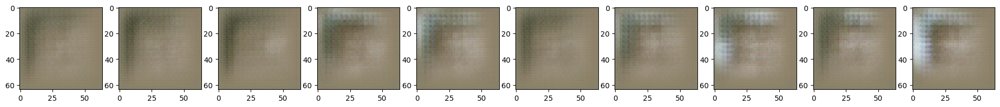

[2] D Loss : 0.31237 GE Loss : 10.45449
[3] D Loss : 0.47952 GE Loss : 9.40508
[4] D Loss : 0.39101 GE Loss : 10.19210
[5] D Loss : 0.87813 GE Loss : 5.99053
[6] D Loss : 0.89900 GE Loss : 5.10403


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


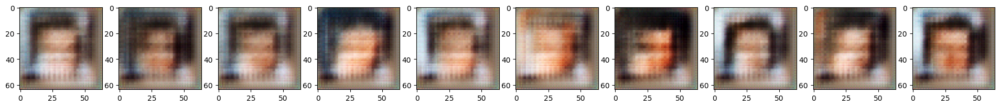

[7] D Loss : 0.91116 GE Loss : 4.73653
[8] D Loss : 0.93098 GE Loss : 4.33704
[9] D Loss : 1.03407 GE Loss : 3.68543
[10] D Loss : 0.98135 GE Loss : 3.82091
[11] D Loss : 1.04992 GE Loss : 3.47179


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

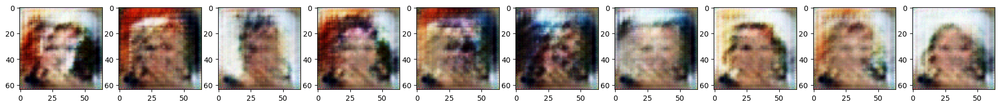

[12] D Loss : 1.08194 GE Loss : 3.18495
[13] D Loss : 1.09794 GE Loss : 3.06662
[14] D Loss : 1.06735 GE Loss : 3.27547
[15] D Loss : 1.11410 GE Loss : 3.83000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

[16] D Loss : 1.07392 GE Loss : 3.21921


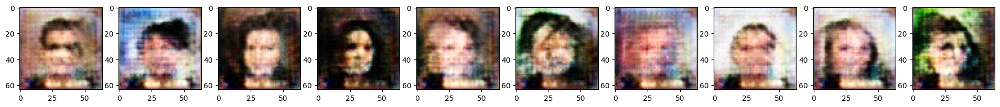

[17] D Loss : 1.06468 GE Loss : 3.21455
[18] D Loss : 1.06072 GE Loss : 3.35570
[19] D Loss : 1.03144 GE Loss : 3.41703
[20] D Loss : 0.99803 GE Loss : 3.69367
[21] D Loss : 0.99398 GE Loss : 3.72290


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

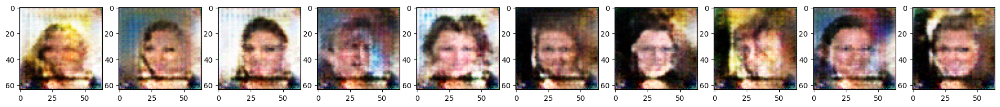

[22] D Loss : 0.93940 GE Loss : 3.98089
[23] D Loss : 0.90899 GE Loss : 4.17820
[24] D Loss : 0.86986 GE Loss : 4.48066
[25] D Loss : 0.84440 GE Loss : 4.64245
[26] D Loss : 0.80795 GE Loss : 4.86375


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

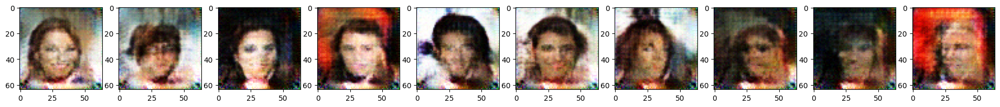

[27] D Loss : 0.79539 GE Loss : 5.02878
[28] D Loss : 0.74387 GE Loss : 5.38539
[29] D Loss : 0.72709 GE Loss : 5.49157
[30] D Loss : 0.68312 GE Loss : 5.87312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

[31] D Loss : 0.68768 GE Loss : 5.87620


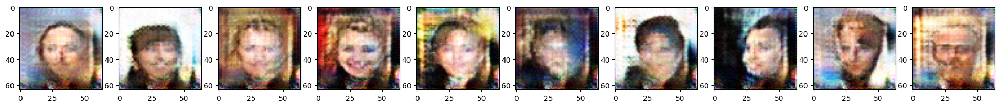

[32] D Loss : 0.65890 GE Loss : 6.09407
[33] D Loss : 0.62890 GE Loss : 6.31687
[34] D Loss : 0.62301 GE Loss : 6.48923
[35] D Loss : 0.59280 GE Loss : 6.69191
[36] D Loss : 0.56057 GE Loss : 6.96362


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

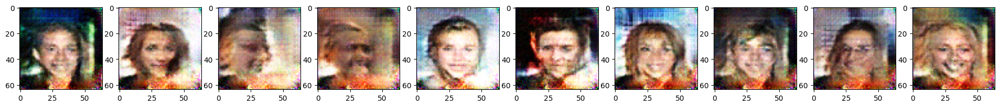

[37] D Loss : 0.57311 GE Loss : 7.00007
[38] D Loss : 0.53857 GE Loss : 7.25702
[39] D Loss : 0.50444 GE Loss : 7.56032
[40] D Loss : 0.49271 GE Loss : 7.79998


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

[41] D Loss : 0.49156 GE Loss : 7.80300


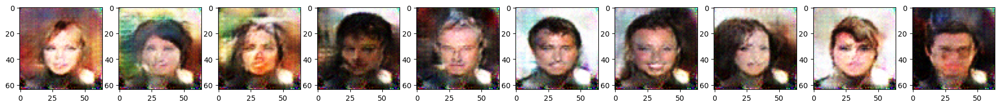

[42] D Loss : 0.48698 GE Loss : 8.14872
[43] D Loss : 0.46880 GE Loss : 8.22480
[44] D Loss : 0.42165 GE Loss : 8.65924
[45] D Loss : 0.43226 GE Loss : 8.78019
[46] D Loss : 0.41205 GE Loss : 8.98794


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

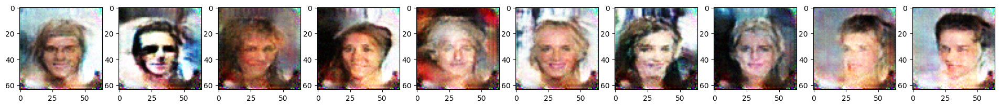

[47] D Loss : 0.42514 GE Loss : 8.88913
[48] D Loss : 0.40902 GE Loss : 9.06992
[49] D Loss : 0.37818 GE Loss : 9.33788
[50] D Loss : 0.38747 GE Loss : 9.41624
[51] D Loss : 0.35149 GE Loss : 9.88163


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

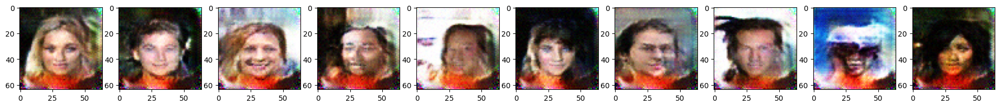

[52] D Loss : 0.35580 GE Loss : 9.80789
[53] D Loss : 0.33438 GE Loss : 10.08724
[54] D Loss : 0.34880 GE Loss : 10.22696
[55] D Loss : 0.33964 GE Loss : 10.25570
[56] D Loss : 0.31554 GE Loss : 10.63339


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

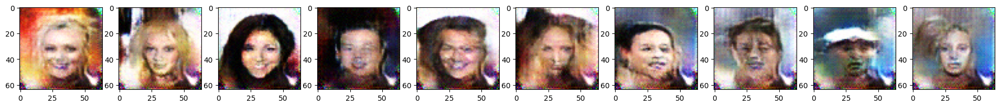

[57] D Loss : 0.30027 GE Loss : 10.92838
[58] D Loss : 0.31418 GE Loss : 10.88634
[59] D Loss : 0.27940 GE Loss : 11.10097
[60] D Loss : 0.30485 GE Loss : 11.34448
[61] D Loss : 0.27831 GE Loss : 11.55488


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

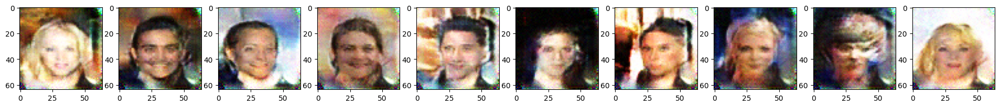

[62] D Loss : 0.25446 GE Loss : 11.86320
[63] D Loss : 0.27823 GE Loss : 11.75544
[64] D Loss : 0.27572 GE Loss : 11.84220
[65] D Loss : 0.26345 GE Loss : 11.97638
[66] D Loss : 0.24325 GE Loss : 12.36770


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

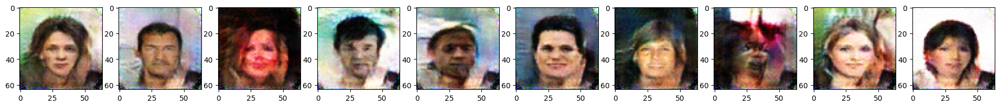

[67] D Loss : 0.23752 GE Loss : 12.34386
[68] D Loss : 0.23757 GE Loss : 12.71460
[69] D Loss : 0.23730 GE Loss : 12.74016
[70] D Loss : 0.23753 GE Loss : 12.66887


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

[71] D Loss : 0.21018 GE Loss : 13.53884


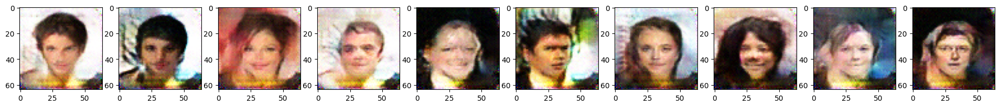

[72] D Loss : 0.23915 GE Loss : 13.33855
[73] D Loss : 0.19529 GE Loss : 13.50455
[74] D Loss : 0.20022 GE Loss : 13.82397
[75] D Loss : 0.19031 GE Loss : 14.39745
[76] D Loss : 0.19922 GE Loss : 13.94489


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

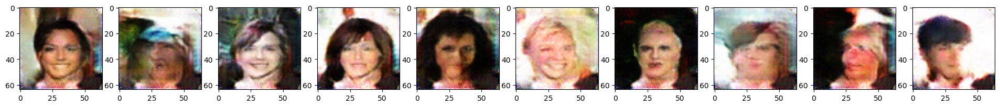

[77] D Loss : 0.20472 GE Loss : 13.79952
[78] D Loss : 0.19327 GE Loss : 14.20748
[79] D Loss : 0.20762 GE Loss : 14.44322
[80] D Loss : 0.19732 GE Loss : 14.28790


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

[81] D Loss : 0.20624 GE Loss : 14.24566


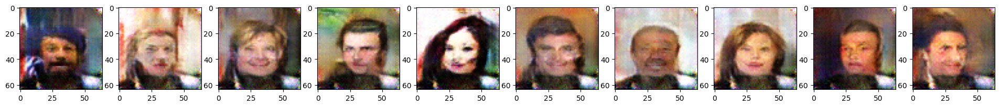

[82] D Loss : 0.07850 GE Loss : 17.82116
[83] D Loss : 0.06355 GE Loss : 20.93063
[84] D Loss : 0.09385 GE Loss : 23.35208
[85] D Loss : 0.04893 GE Loss : 21.24736
[86] D Loss : 0.04485 GE Loss : 24.58815


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

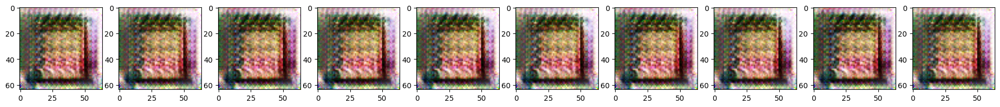

[87] D Loss : 0.04867 GE Loss : 26.56986
[88] D Loss : 0.04887 GE Loss : 24.54423
[89] D Loss : 0.04010 GE Loss : 25.14383
[90] D Loss : 0.03017 GE Loss : 26.58625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

[91] D Loss : 0.13156 GE Loss : 26.95959


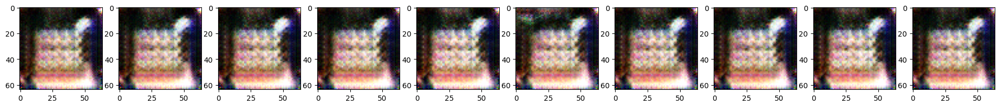

[92] D Loss : 0.13060 GE Loss : 19.86175
[93] D Loss : 0.05321 GE Loss : 22.56228
[94] D Loss : 0.16064 GE Loss : 20.61021
[95] D Loss : 0.05167 GE Loss : 20.00813
[96] D Loss : 0.03381 GE Loss : 22.46942


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

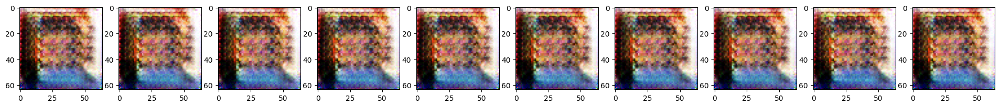

[97] D Loss : 0.03430 GE Loss : 24.21801
[98] D Loss : 0.02484 GE Loss : 26.12582
[99] D Loss : 0.02207 GE Loss : 27.00571
[100] D Loss : 0.02639 GE Loss : 28.18942


In [13]:
epochs = 100
num_steps = len(train_dataloader.dataset)//batch_size

clip_value = 1.2

for epoch in tqdm(range(epochs)):
    ge_loss, d_loss = 0, 0
    for step, (X) in enumerate(train_dataloader):
        X = X.to(device)
        y_true = Variable(torch.ones(X.size(0),1, dtype=torch.float).to(device), requires_grad = False)
        y_fake = Variable(torch.zeros(X.size(0), 1, dtype=torch.float).to(device), requires_grad = False)
        
        noise1 = Variable(torch.Tensor(X.size()).normal_(0, 0.1 * (epochs - epoch) / epochs),requires_grad=False).to(device)
        noise2 = Variable(torch.Tensor(X.size()).normal_(0, 0.1 * (epochs - epoch) / epochs),requires_grad=False).to(device)
   
        ######## TRAINING DISCRIMINATOR ###########
        opt_d.zero_grad()

        z_fake = Variable(torch.randn((X.size(0), z_dim, 1, 1)).to(device), requires_grad = False)
        x_fake = g(z_fake)

        z_true = e(X)

        out_true = d(X+noise1, z_true).view(X.shape[0],-1)
        out_fake = d(x_fake+noise2, z_fake).view(X.shape[0],-1)

        loss_d = torch.mean(F.softplus(-out_true)) + torch.mean(F.softplus(out_fake))
        loss_d.backward()
        nn.utils.clip_grad_value_(d.parameters(), clip_value)
        opt_d.step()
            
        ######## TRAINING GENERATOR AND ENCODER PART ###########
            
        opt_ge.zero_grad()
            
        z_fake = Variable(torch.randn((X.size(0), z_dim, 1, 1)).to(device), requires_grad = False)
        x_fake = g(z_fake)

        z_true = e(X)

        out_true = d(X+noise1, z_true).view(X.shape[0],-1)
        out_fake = d(x_fake+noise2, z_fake).view(X.shape[0],-1)
            
        loss_ge = torch.mean(F.softplus(out_true)) + torch.mean(F.softplus(-out_fake))
        loss_ge.backward()
        nn.utils.clip_grad_value_(ge_param, clip_value)
        opt_ge.step()
            
        ge_loss += loss_ge.item()
        d_loss += loss_d.item()
            
    print(f"[{epoch+1}] D Loss : {d_loss/num_steps:>.5f} GE Loss : {ge_loss/num_steps:>.5f}")
    if (epoch+1) % 5 == 0:
        z_fake = torch.randn((X.size(0), z_dim, 1, 1)).to(device)
        plot_img(g(z_fake)) 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

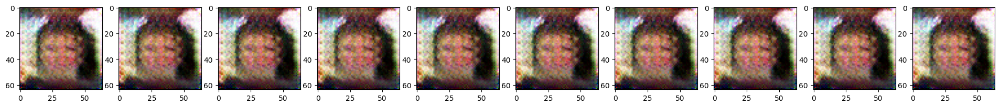

In [14]:
z_fake = torch.randn((batch_size, z_dim, 1, 1)).to(device)
plot_img(g(z_fake))

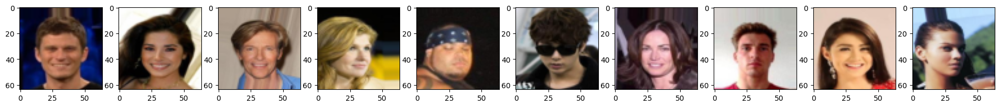

In [15]:
plot_img(X)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

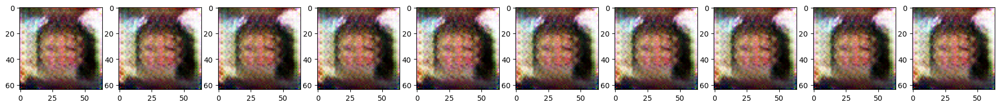

In [16]:
plot_img(g(e(X)))